In [1]:
import os
import torch
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import cv2
from typing import Optional, Union, Tuple, List, Callable, Dict
from IPython.display import display, HTML
from tqdm.notebook import tqdm
import torch.nn.functional as nnf
from diffusers import DiffusionPipeline
import abc
from ProT2I.processors import *
import matplotlib.pyplot as plt
from torchvision.utils import save_image

In [2]:
def text_under_image(image: np.ndarray, text: str, text_color: Tuple[int, int, int] = (0, 0, 0)):
    h, w, c = image.shape
    offset = int(h * .2)
    img = np.ones((h + offset, w, c), dtype=np.uint8) * 255
    font = cv2.FONT_HERSHEY_SIMPLEX
    img[:h] = image
    textsize = cv2.getTextSize(text, font, 1, 2)[0]
    text_x, text_y = (w - textsize[0]) // 2, h + offset - textsize[1] // 2
    cv2.putText(img, text, (text_x, text_y ), font, 1, text_color, 2)
    return img

def view_images(images, num_rows=1, offset_ratio=0.02):
    if type(images) is list:
        if isinstance(images[0], Image.Image):
            h, w = images[0].size
            images = [np.array(img) for img in images]
        num_empty = len(images) % num_rows
    elif images.ndim == 4:
        num_empty = images.shape[0] % num_rows
    else:
        images = [images]
        num_empty = 0

    empty_images = np.ones(images[0].shape, dtype=np.uint8) * 255
    images = [image.astype(np.uint8) for image in images] + [empty_images] * num_empty
    num_items = len(images)

    h, w, c = images[0].shape
    offset = int(h * offset_ratio)
    num_cols = num_items // num_rows
    image_ = np.ones((h * num_rows + offset * (num_rows - 1),
                      w * num_cols + offset * (num_cols - 1), 3), dtype=np.uint8) * 255
    for i in range(num_rows):
        for j in range(num_cols):
            image_[i * (h + offset): i * (h + offset) + h:, j * (w + offset): j * (w + offset) + w] = images[
                i * num_cols + j]

    pil_img = Image.fromarray(image_)
    display(pil_img)


    
def aggregate_attention(attention_store: AttentionStore, res: int, from_where: List[str], is_cross: bool, select: int):
    out = []
    attention_maps = attention_store.get_average_attention()
    num_pixels = res ** 2
    for location in from_where:
        for item in attention_maps[f"{location}_{'cross' if is_cross else 'self'}"]:
            if item.shape[1] == num_pixels:
                cross_maps = item.reshape(len(prompts), -1, res, res, item.shape[-1])[select]
                out.append(cross_maps)
    out = torch.cat(out, dim=0)
    out = out.sum(0) / out.shape[0]
    return out.cpu()


def show_cross_attention(attention_store:AttentionStore, res: int, from_where: List[str], select: int = 0, words: List[str] = None):
    tokens = tokenizer.encode(prompts[select])
    decoder = tokenizer.decode
    attention_maps = aggregate_attention(attention_store, res, from_where, True, select) * 100
    images = []
    if words:
        token_texts = [decoder(int(token)) for token in tokens]
        token_indices = [i for i, text in enumerate(token_texts) if text in words]
    else:
        token_indices = range(len(tokens))
    for i in token_indices:
        image = attention_maps[:, :, i]
        # image = 255 * (image / image.max())
        image = (image - image.min()) / (image.max() - image.min())  # 归一化到0-1范围
        image = 255 * (image ** 0.85)  # 强化高亮区域，对比度进一步提升
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        image = text_under_image(image, decoder(int(tokens[i])))
        images.append(image)
    view_images(np.stack(images, axis=0))

def show_images(desc:List[str], images:List, num_rows:int=1, Offset_ratio:float=0.02):
    imgs = []
    assert len(desc) == len(images), "Length of desc and images should be equal."
    for i, image in enumerate(images):
        if isinstance(image, Image.Image):
            image = np.array(image.resize((256, 256)))
        image = text_under_image(image, desc[i])
        imgs.append(image)
    view_images(np.stack(imgs, axis=0), num_rows=num_rows,offset_ratio=Offset_ratio)
        

def show_self_attention(attention_stores:List[AttentionStore], from_where: str, layers:int):
    top_components = []
    # the first self attention map
    first_attention_map = attention_stores[0].get_average_attention()[from_where][layers][:8].mean(dim=0)
    U, S, V = torch.svd(first_attention_map.to(torch.float32))
    top_U = U[:, :6]
    top_components.append(top_U)
    for i, attention_store in enumerate(attention_stores, start=0):
        attention_map = (attention_store.get_average_attention()[from_where][layers][8:]).mean(dim=0).to(torch.float32)
        U, S, V = torch.svd(attention_map)
        top_U = U[:,:6]
        top_components.append(top_U)

    for batch_idx, components in enumerate(top_components):
        plt.figure(figsize=(24, 4))
        for comp_idx in range(6):
            plt.subplot(1, 6, comp_idx + 1)
            component = components[:,comp_idx].reshape(32,32).to('cpu')
            plt.imshow(component, cmap='viridis')
            # plt.colorbar()
            plt.axis('off')
            plt.title(f'prompt {batch_idx + 1} Top {comp_idx + 1}')
        plt.tight_layout()
        plt.show()


## SDXL

In [3]:
from ProT2I.prot2i_pipeline_sdxl import ProT2IPipeline
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
if device.type == "cuda":
    pipe = ProT2IPipeline.from_pretrained("SG161222/RealVisXL_V4.0",
                                                torch_dtype=torch.float16, use_safetensors=True).to(device)
else:
    pipe = ProT2IPipeline.from_pretrained("SG161222/RealVisXL_V4.0",
                                                torch_dtype=torch.float32, use_safetensors=False).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### One subject, one branch
To save memory consumption, we can add the attributes belonging to one subject at once. For example, the "brown" and "grey hat" attribute are belonging to the subject "cat", and "pink" and "blue icing accents" attribtues are belonging to the subject "cake". The branches decomposition are as follows:

<class 'ProT2I.prot2i_pipeline_sdxl.ProT2IPipeline'>


  0%|          | 0/50 [00:00<?, ?it/s]

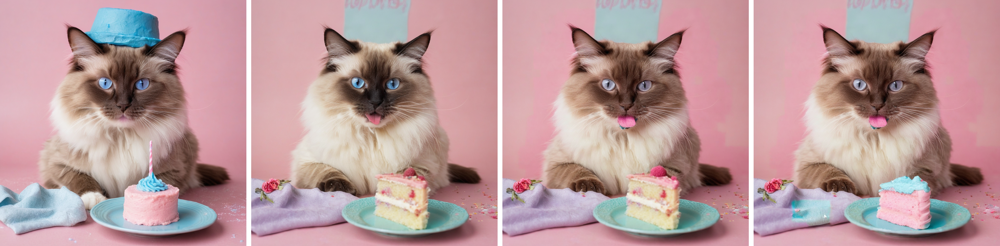

In [4]:
seed = 487915
g_cpu = torch.Generator().manual_seed(seed)



# 分词结果
nps = [
        "A brown Ragdoll cat wearing a grey hat is eating a pink cake with blue icing accents",
        "A Ragdoll cat is eating a cake",
        "A brown Ragdoll cat wearing a grey hat is eating a pink cake",
        "A brown Ragdoll cat wearing a grey hat is eating a pink cake with blue icing accents"
        ]

lb_words_list = [None, ["cat","cat"],["cake","cake"]]
prompts=["A brown Ragdoll cat wearing a grey hat is eating a pink cake with blue icing accents"]

n_self_replace = 0.8
n_cross_replace = 0.0
# 定制controller
attn_res = (32,32)
lb_threshold = 0.55
controller_np = [[nps[i-1],nps[i]] for i in range(1, len(nps))]
controller_list = []
for i, np_pair in enumerate(controller_np):
    if i == 0:
        controller_kwargs = {
            "edit_type": "refine",
            "local_blend_words": lb_words_list[i],
            "equalizer_words": None,
            "equalizer_strengths": None,
            "n_cross_replace": {"default_": 0.5},
            "n_self_replace": 0.4,
            "lb_threshold": lb_threshold,
        }
        controller = create_controller(prompts=np_pair, cross_attention_kwargs=controller_kwargs, num_inference_steps=50,tokenizer=pipe.tokenizer, device=device, attn_res=attn_res)
        controller_list.append(controller)
    else:
        controller_kwargs = {
            "edit_type": "refine",
            "local_blend_words":lb_words_list[i],
            "equalizer_words": None,
            "equalizer_strengths": None,
            "n_cross_replace": {"default_": n_cross_replace},
            "n_self_replace": n_self_replace,
            "lb_threshold": lb_threshold,
        }
        controller = create_controller(prompts=np_pair, cross_attention_kwargs=controller_kwargs, num_inference_steps=50,tokenizer=pipe.tokenizer, device=device, attn_res=attn_res)
        controller_list.append(controller)


assert len(controller_list)+1 == len(nps), f"The length of controller list is {len(controller_list)}, but nps {len(nps)}"


cross_attention_kwargs = {
    "nps": nps,
    "clip_work": False,
    "set_controller": controller_list,
    }

print(type(pipe))
p2p_output = pipe(prompts, cross_attention_kwargs=cross_attention_kwargs, num_inference_steps=50, num_images_per_prompt=1,generator=g_cpu)
view_images(p2p_output[0]["images"])

### One attribute, one branch
For greater accuracy, we can increase the number of branches generated to add one attribute at a time.

<class 'ProT2I.prot2i_pipeline_sdxl.ProT2IPipeline'>


  0%|          | 0/50 [00:00<?, ?it/s]

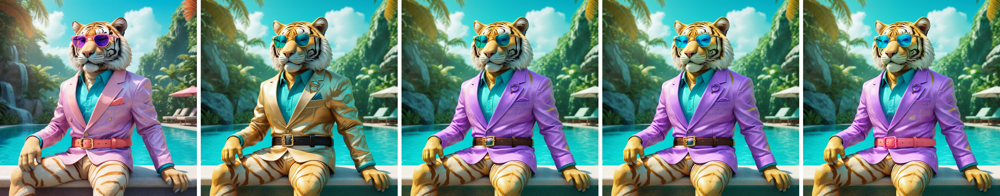

In [4]:
seed = 3173
g_cpu = torch.Generator().manual_seed(seed)



# 分词结果
nps = [
        "A golden beige tiger mascot with a sleek body, donning a dreamy lavender jacket , sky-blue sunglasses , and a coral-pink belt , lounging near a pool of glowing turquoise water in a fantasy jungle.",
        "A golden beige tiger mascot with a sleek body, donning a jacket , sunglasses , and a belt , lounging near a pool of glowing turquoise water in a fantasy jungle.",
        "A golden beige tiger mascot with a sleek body, donning a dreamy lavender jacket , sunglasses , and a belt , lounging near a pool of glowing turquoise water in a fantasy jungle.",
        "A golden beige tiger mascot with a sleek body, donning a dreamy lavender jacket , sky-blue sunglasses , and a belt , lounging near a pool of glowing turquoise water in a fantasy jungle.",
        "A golden beige tiger mascot with a sleek body, donning a dreamy lavender jacket , sky-blue sunglasses , and a coral-pink belt , lounging near a pool of glowing turquoise water in a fantasy jungle."
        ]

lb_words_list = [None, ["jacket,","jacket"],["sunglasses","sunglasses"],["belt","belt"]]
prompts=["A golden beige tiger mascot with a sleek body, donning a dreamy lavender jacket , sky-blue sunglasses , and a coral-pink belt , lounging near a pool of glowing turquoise water in a fantasy jungle."]

n_self_replace = 0.8
n_cross_replace = 0.0
# 定制controller
attn_res = (32,32)
lb_threshold = 0.55
controller_np = [[nps[i-1],nps[i]] for i in range(1, len(nps))]
controller_list = []
for i, np_pair in enumerate(controller_np):
    if i == 0:
        controller_kwargs = {
            "edit_type": "refine",
            "local_blend_words": lb_words_list[i],
            "equalizer_words": None,
            "equalizer_strengths": None,
            "n_cross_replace": {"default_": 0.5},
            "n_self_replace": 0.4,
            "lb_threshold": lb_threshold,
        }
        controller = create_controller(prompts=np_pair, cross_attention_kwargs=controller_kwargs, num_inference_steps=50,tokenizer=pipe.tokenizer, device=device, attn_res=attn_res)
        controller_list.append(controller)
    else:
        controller_kwargs = {
            "edit_type": "refine",
            "local_blend_words":lb_words_list[i],
            "equalizer_words": None,
            "equalizer_strengths": None,
            "n_cross_replace": {"default_": n_cross_replace},
            "n_self_replace": n_self_replace,
            "lb_threshold": lb_threshold,
        }
        controller = create_controller(prompts=np_pair, cross_attention_kwargs=controller_kwargs, num_inference_steps=50,tokenizer=pipe.tokenizer, device=device, attn_res=attn_res)
        controller_list.append(controller)


assert len(controller_list)+1 == len(nps), f"The length of controller list is {len(controller_list)}, but nps {len(nps)}"


cross_attention_kwargs = {
    "nps": nps,
    "clip_work": False,
    "set_controller": controller_list,
    }

print(type(pipe))
p2p_output = pipe(prompts, cross_attention_kwargs=cross_attention_kwargs, num_inference_steps=50, num_images_per_prompt=1,generator=g_cpu)
view_images(p2p_output[0]["images"])

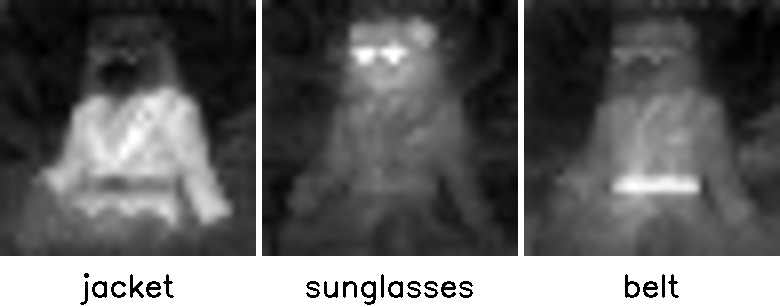

In [5]:
controller = p2p_output[1][3]
tokenizer = pipe.tokenizer
show_cross_attention(attention_store=controller, res=controller.attn_res[0], from_where=["down",'up','mid'],select=0, words=["jacket","sunglasses","belt"])